In [4]:
from google.colab import drive
import os

drive.mount('/content/drive/')

Mounted at /content/drive/


In [5]:
# 작업 경로를 MyDrive로 변경하여 구글 드라이브에 접속 후 바로 작업 디렉토리를 확인 가능

print('현재 작업 경로 :', os.getcwd())
os.chdir('/content/drive/MyDrive')
print('변경된 작업 경로 :', os.getcwd())

현재 작업 경로 : /content
변경된 작업 경로 : /content/drive/MyDrive


In [6]:
# 처음에 한번만 실행 !
!git clone https://github.com/ultralytics/yolov5  # YOLOv5 레퍼지토리 clone

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [7]:
# 필요한 패키지 다운로드 및 임포트
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import yaml
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

/content/drive/MyDrive/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.7/645.7 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/

In [8]:
# 사용할 데이터셋 경로 및 데이터셋의 yaml 파일 경로 지정
data_dir = '/content/drive/MyDrive/dataset/cavity'
data_yaml = '/content/drive/MyDrive/dataset/cavity/data.yaml'

In [9]:
# 데이터셋 yaml 파일 확인
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

{'names': ['cavity', 'normal'],
 'nc': 2,
 'roboflow': {'license': 'CC BY 4.0',
  'project': 'cavity-n3ioq',
  'url': 'https://universe.roboflow.com/duong-duc-cuong/cavity-n3ioq/dataset/2',
  'version': 2,
  'workspace': 'duong-duc-cuong'},
 'test': '../test/images',
 'train': '/content/drive/MyDrive/dataset/cavity/train/images',
 'val': '/content/drive/MyDrive/dataset/cavity/valid/images'}

In [10]:
# yaml 파일의 train, val 데이터가 있는 경로 수정 (기존 경로 -> 구글 드라이브에 저장된 경로로)
film['train'] = '/content/drive/MyDrive/dataset/cavity/train/images'
film['val'] = '/content/drive/MyDrive/dataset/cavity/valid/images'

with open(data_yaml, 'w') as f:
    yaml.dump(film, f)

print('변경된 yaml 파일 :')
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

변경된 yaml 파일 :


{'names': ['cavity', 'normal'],
 'nc': 2,
 'roboflow': {'license': 'CC BY 4.0',
  'project': 'cavity-n3ioq',
  'url': 'https://universe.roboflow.com/duong-duc-cuong/cavity-n3ioq/dataset/2',
  'version': 2,
  'workspace': 'duong-duc-cuong'},
 'test': '../test/images',
 'train': '/content/drive/MyDrive/dataset/cavity/train/images',
 'val': '/content/drive/MyDrive/dataset/cavity/valid/images'}

In [11]:
#img: 입력 이미지 크기
#batch: 배치 사이즈
#epochs: 총 학습 에폭
#data: 데이터셋 yaml 파일 경로
#weights: 모델 웨이트 경로(pre-train된 모델로 학습시키기 때문에)
#cache: 캐시 이미지


!python train.py --img 416 --batch 16 --epochs 150 --data {data_yaml} --weights yolov5s.pt --cache

2023-11-24 06:29:59.371179: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-24 06:29:59.371246: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-24 06:29:59.371290: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/dataset/cavity/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD

In [12]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2023-11-24 06:53:00.994714: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-24 06:53:00.994781: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-24 06:53:00.994809: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-24 06:53:01.002562: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with t

# 6. 학습한 모델 테스트

In [13]:
# 테스트 이미지 경로
test_data_dir = film['val']

# 실험 번호 지정 - 진행한 실험이 저장된 경로 확인해서 기입! - runs/train/exp1 인지 exp2, exp3 인지 확인 후 아래 번호 지정
train_exp_num = 4

In [14]:
!python detect.py --weights runs/train/exp{train_exp_num}/weights/best.pt --img 416 --conf 0.1 --source {test_data_dir}

detect: weights=['runs/train/exp4/weights/best.pt'], source=/content/drive/MyDrive/dataset/cavity/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-245-g3d8f004 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/81 /content/drive/MyDrive/dataset/cavity/valid/images/100_jpg.rf.80d4a94694549f91580f9c2c3805bcf6.jpg: 288x416 11 cavitys, 5 normals, 45.9ms
image 2/81 /content/drive/MyDrive/dataset/cavity/valid/images/101_0050_JPG.rf.3eb7835f3e615b2c2eef4de8cba4aef7.jpg: 352x416 6 cavitys, 9 normals, 43.8

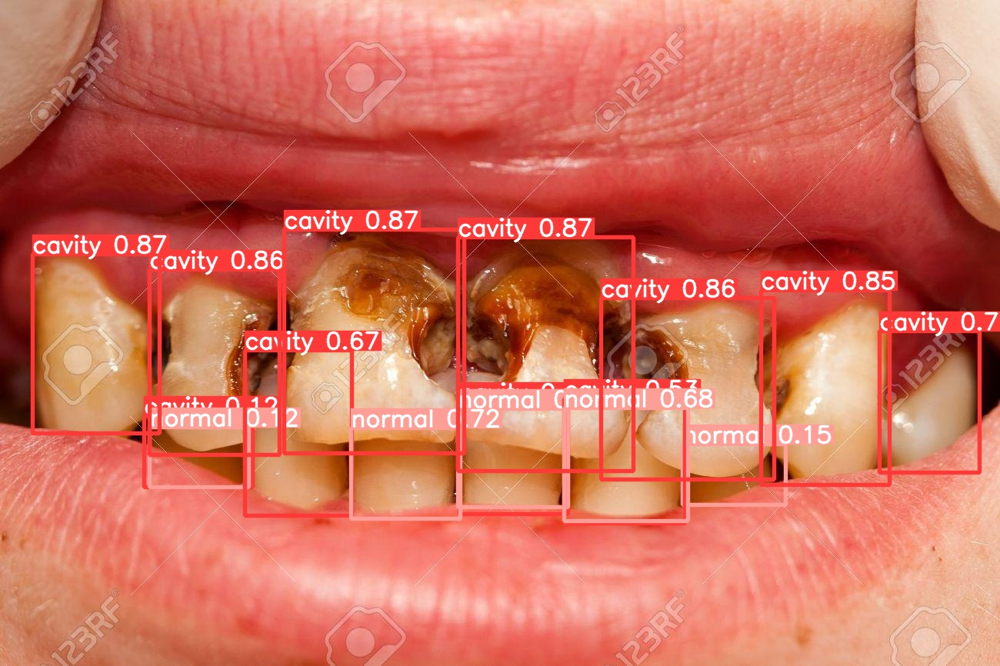

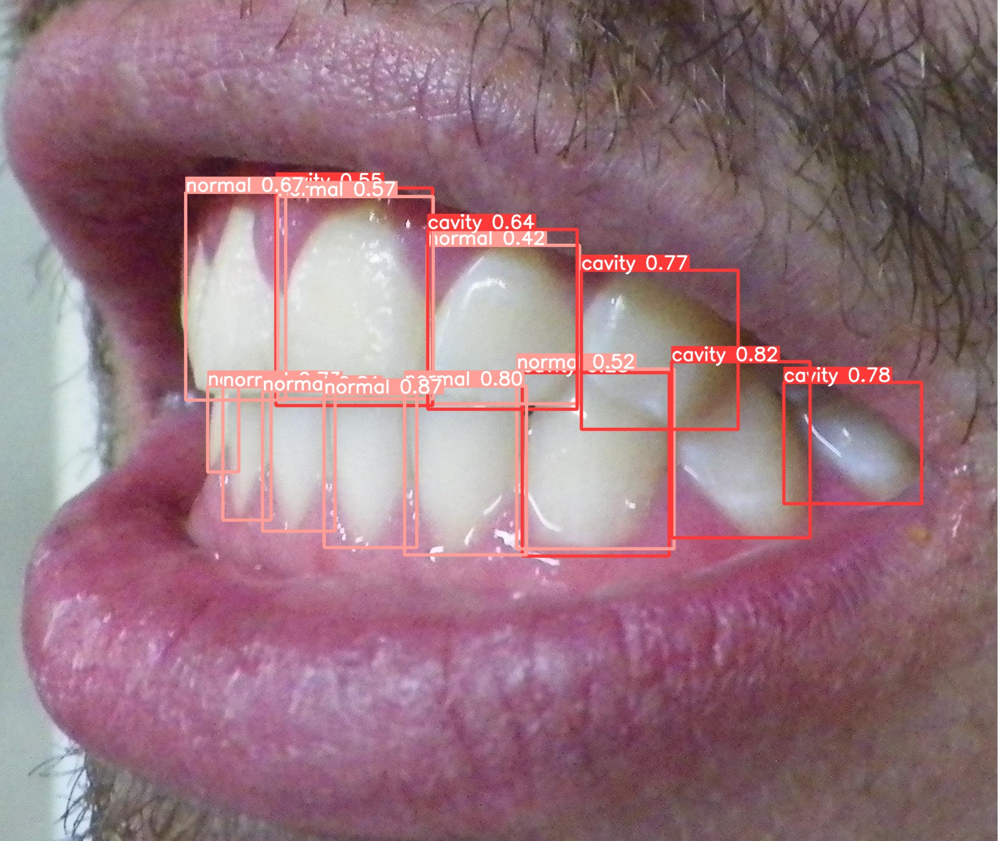

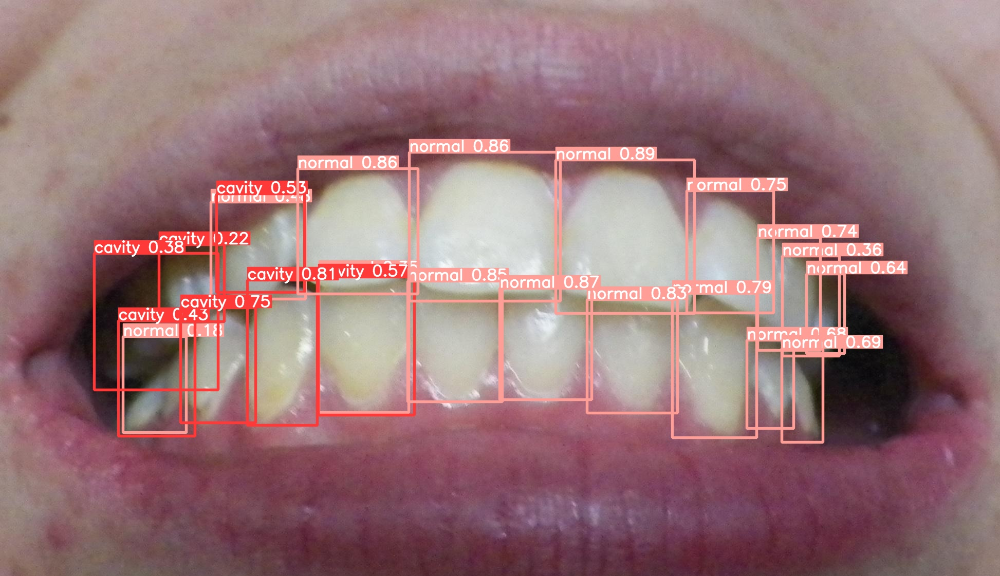

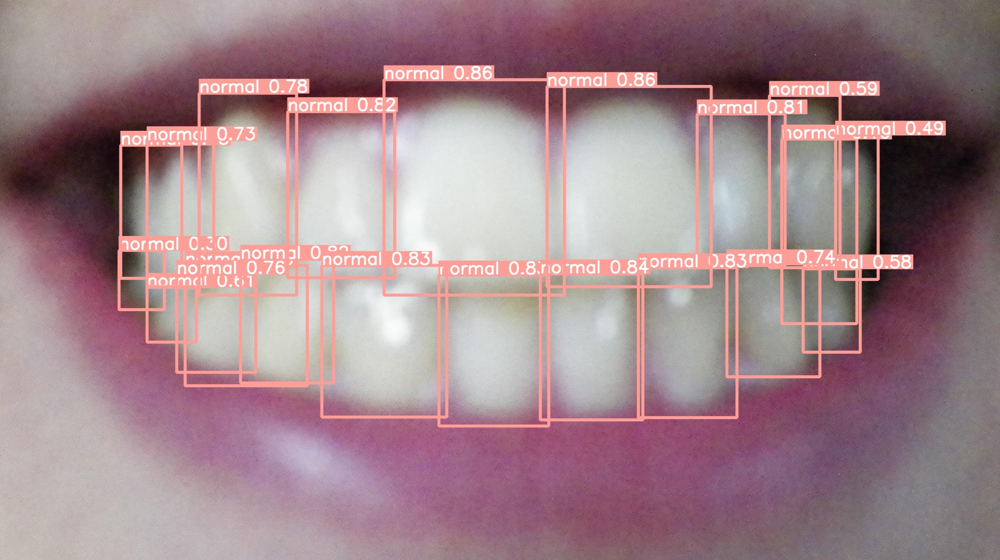

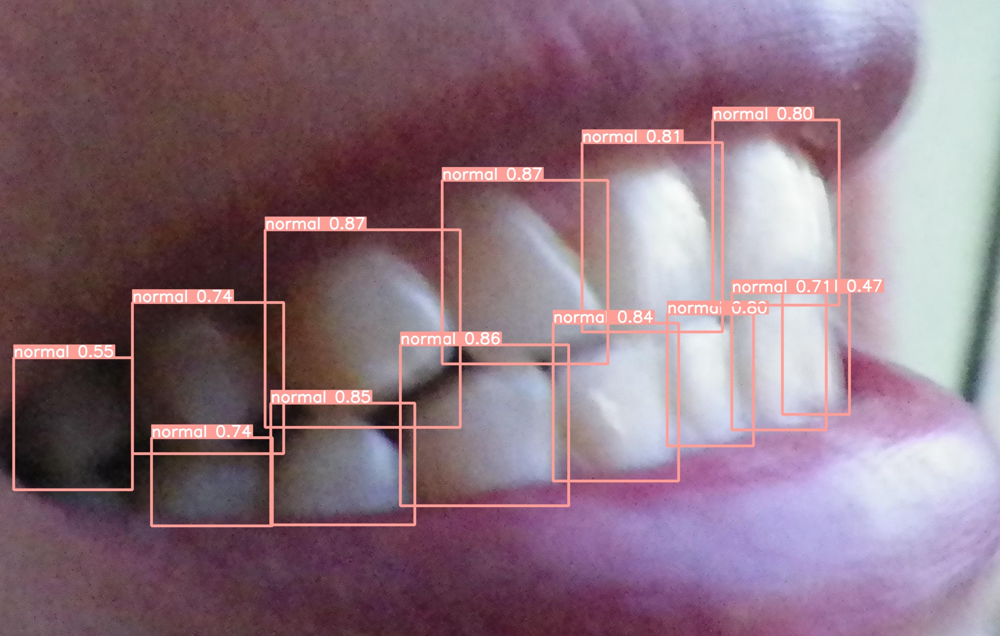

...

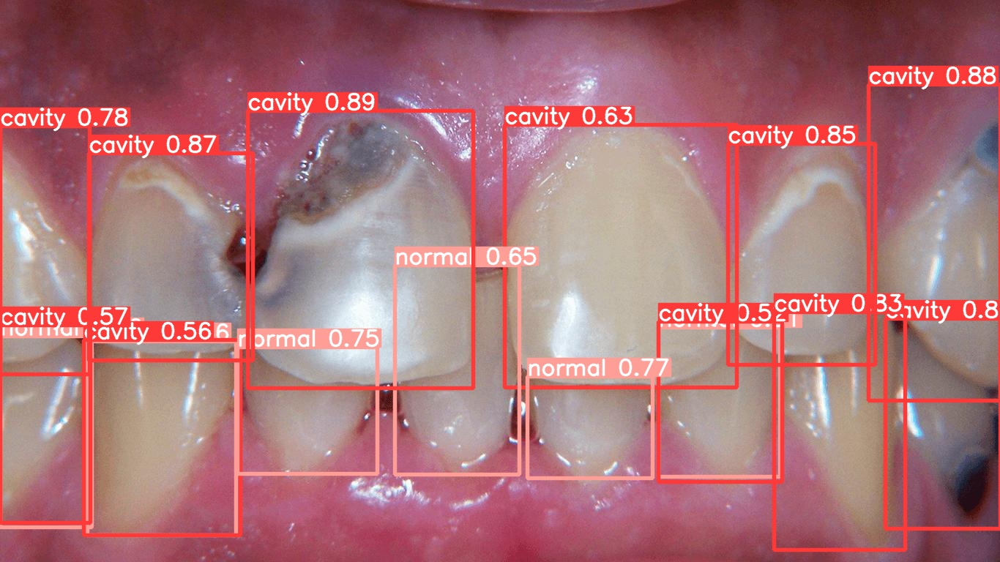

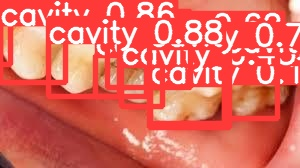

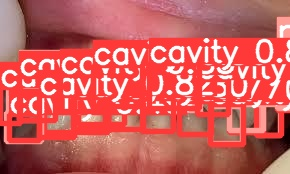

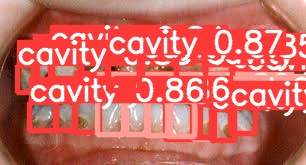

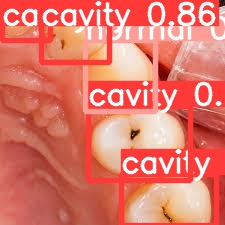

In [16]:
# 테스트 결과 확인해보기

import glob
from IPython.display import Image, display

test_exp_num = 4

if not os.path.exists('/content/drive/MyDrive/yolov5/runs/detect/exp' + str(test_exp_num) + '/') :
  raise Exception('test_exp_num 을 다시 확인하세요.')

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp' + str(test_exp_num) + '/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## 7. 학습한 베스트 모델 저장

In [17]:
# 학습한 베스트 모델 저장
from google.colab import files
files.download('./runs/train/exp' + str(test_exp_num) + '/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>